## Conditional Histograms (Single Exemplar Image)
create conditional histograms (filter image conditioned on another)

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import pandas as pd
import scipy as scp


import utils.pc_utils_pyramid as pc
import utils.distributions as dsts
import utils.imread_utils as imr
import utils.calc_entropy as cen
import utils.luminance as lum
import utils.conditional_hists as ch

import pyrtools as pt
import imp

%config InlineBackend.print_figure_kwargs = {'dpi' : 200} #plotting pretty

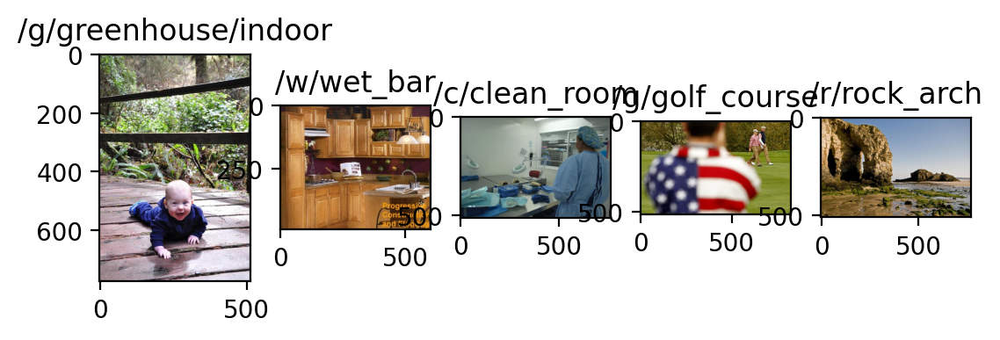

In [2]:
#some settings for the dataset
p65folder = '/home/vasha/phaseanalysis/images/places365/'
imfolder = p65folder+'val_large/'
imname = 'Places365_val_'
crop_size = (512,512)

#metadata
colnames = ['filename','category_ID']
df_fname_cid = pd.read_table(p65folder+'places365_val.txt',sep=' ',header=None,names=colnames)
colnames = ['category','category_ID']
df_cat_cid = pd.read_table(p65folder+'categories_places365.txt',sep=' ',header=None,names=colnames)
df_cat_lab = pd.read_csv(p65folder+'SceneHierarchy_Places365.csv', header=1)
df_cat_lab = df_cat_lab.iloc[:, 0:4] #don't need more specific than indoor/outdoor manmade/natural
df = pd.concat([df_cat_cid, df_cat_lab.iloc[:,1:]], axis=1)
df = pd.merge(df_fname_cid, df, on=['category_ID']).sort_values('filename')

#plt.figure(figsize=(15,3))
nims = 8
cropsize = 128
#keep list
imlist = []
imlumlist = []
imlumcroplist = []
catlist = []

#show only a few
nims_show = 5

for imn in range(nims):
    imn = imn+1
    testim_fname = imname+str(imn).zfill(8)+'.jpg'
    testim = imr.readin_im(testim_fname, imfolder)
    testim_cat = df.loc[df['filename'] == testim_fname,'category'].item()
    imlist.append(testim)
    testimlum = lum.calc_lum_img(testim)
    imlumlist.append(testimlum)
    imlumcroplist.append(testimlum[:cropsize,:cropsize])
    catlist.append(testim_cat)
    #print(testim_cat)
    if(imn <= nims_show):
        plt.subplot(1,nims_show,imn)
        plt.imshow(testim)
        plt.title(testim_cat)
plt.show()

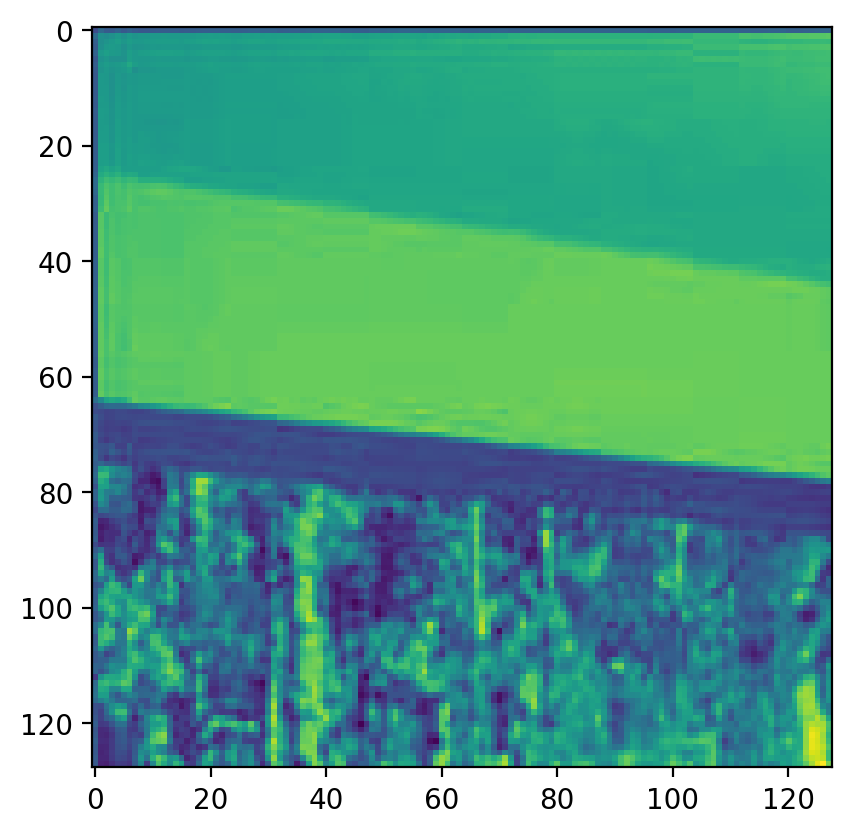

In [3]:
num_orientations=4 
pyrlist = []

for img in imlumcroplist:
    img_pyr = pt.pyramids.SteerablePyramidFreq(img, order=num_orientations-1, is_complex=True) #number of orientations is defined as order+1 in steerable pyramid source code
    pyrlist.append(img_pyr)

pyr_height = int((len(img_pyr.pyr_size)-2)/(num_orientations+1))

plt.imshow(img)
plt.show()

Real


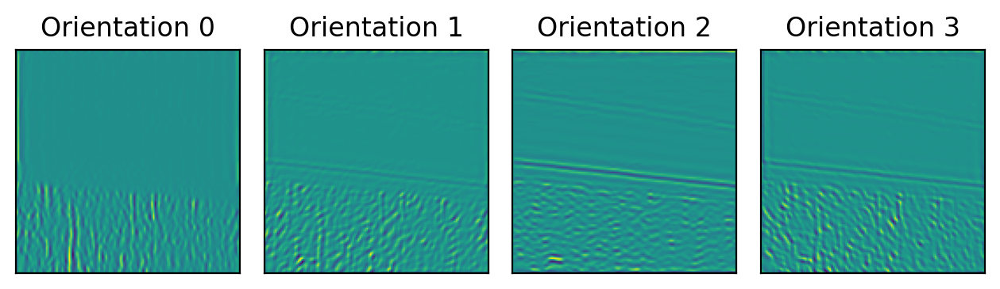

Imaginary


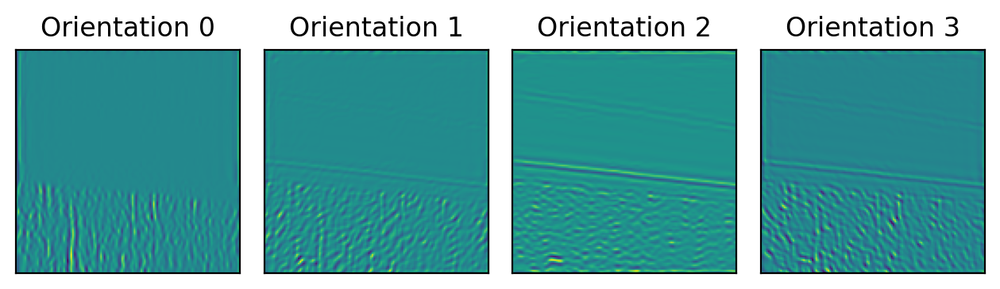

Absolute Value of complex number


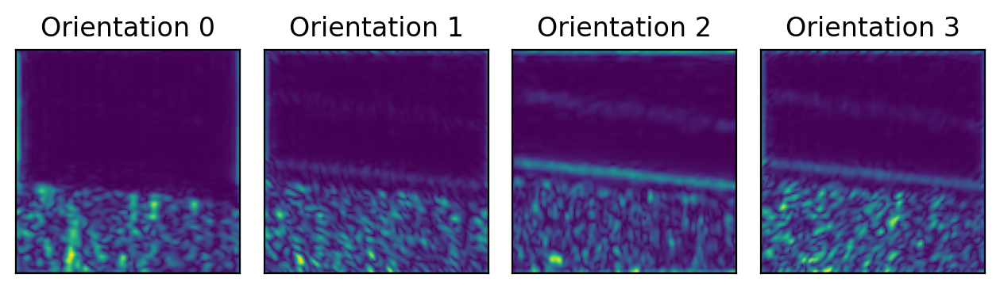

Magnitude calculated as sqrt of sum of squares


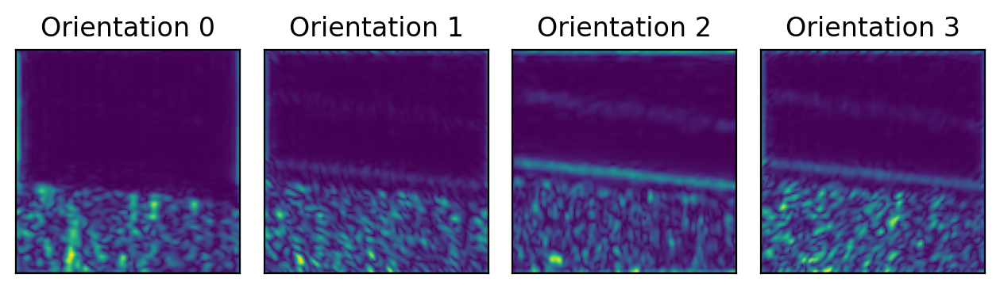

In [4]:
print('Real')
for o in range(num_orientations):
    plt.subplot(1,num_orientations,o+1)
    plt.imshow(np.real(img_pyr.pyr_coeffs[(0,o)]))
    plt.title(f'Orientation {o}')
    plt.tick_params(left = False, right = False , labelleft = False ,
                labelbottom = False, bottom = False)
plt.tight_layout()
plt.show()

print('Imaginary')
for o in range(num_orientations):
    plt.subplot(1,num_orientations,o+1)
    plt.imshow(np.imag(img_pyr.pyr_coeffs[(0,o)]))
    plt.title(f'Orientation {o}')
    plt.tick_params(left = False, right = False , labelleft = False ,
                labelbottom = False, bottom = False)
plt.tight_layout()
plt.show()

print('Absolute Value of complex number')
for o in range(num_orientations):
    plt.subplot(1,num_orientations,o+1)
    plt.imshow(np.abs(img_pyr.pyr_coeffs[(0,o)]))
    plt.title(f'Orientation {o}')
    plt.tick_params(left = False, right = False , labelleft = False ,
                labelbottom = False, bottom = False)
plt.tight_layout()
plt.show()

print('Magnitude calculated as sqrt of sum of squares')
for o in range(num_orientations):
    plt.subplot(1,num_orientations,o+1)
    plt.imshow(np.sqrt((np.imag(img_pyr.pyr_coeffs[(0,o)])**2 + np.real(img_pyr.pyr_coeffs[(0,o)])**2)))
    plt.title(f'Orientation {o}')
    plt.tick_params(left = False, right = False , labelleft = False ,
                labelbottom = False, bottom = False)
plt.tight_layout()
plt.show()

## Butterfly Conditional Histograms

Cross Subband Part, Same Orientation, Same Level:  
- Real x Imaginary  
 - Real x Magnitude
 
Cross Orientation, Same Level  
 - Real
 - Imaginary
 - Magnitude
 
Cross Level, Same Orientation  
 - Real
 - Imaginary
 - Magnitude
 
Cross Level, Cross Orientation  
 - Real
 - Imaginary
 - Magnitude

### Within Level, Cross Orientation

Level 0 Magnitude
***

/home/vasha/video_filtering/utils/conditional_hists.py:49: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  butterfly)


***********

/home/vasha/video_filtering/utils/conditional_hists.py:35: RuntimeWarning: invalid value encountered in true_divide
  rowhist = rowhist/np.max(rowhist) #normalize fo fill range[0,1]


**

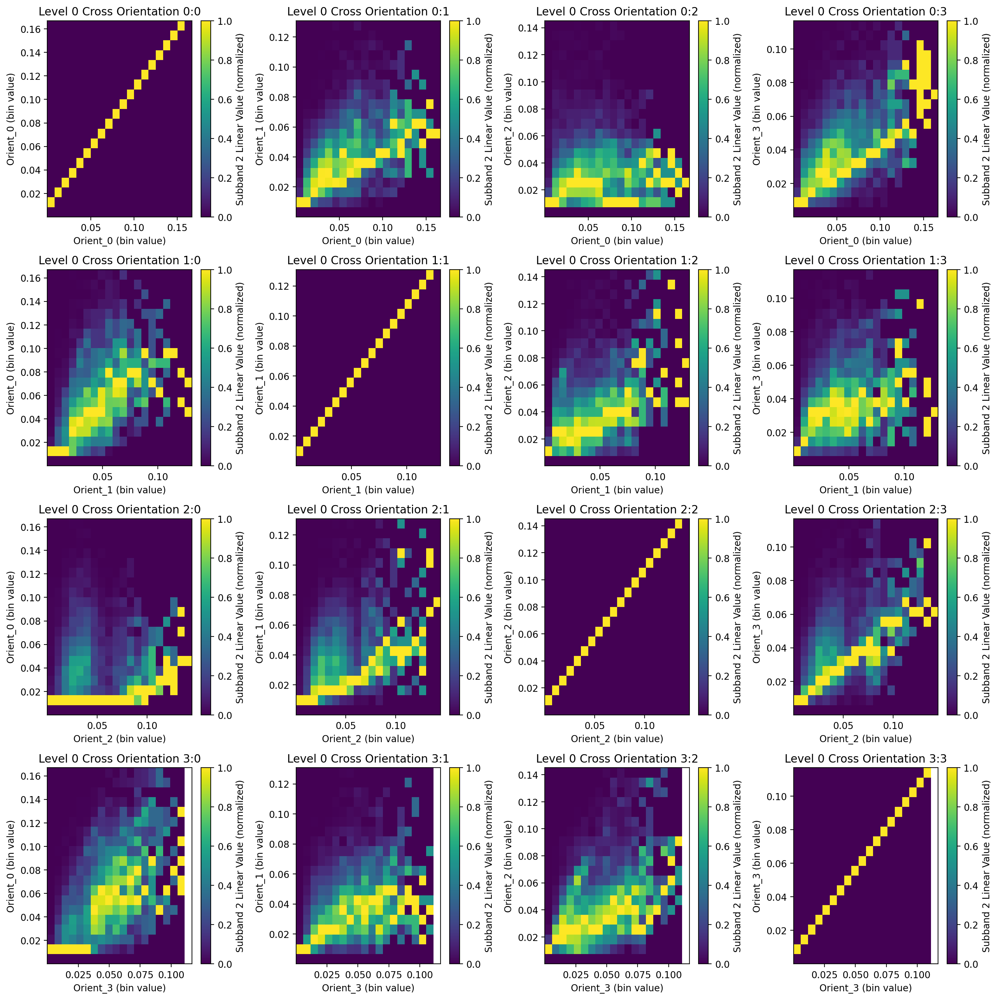

Level 1 Magnitude
****************

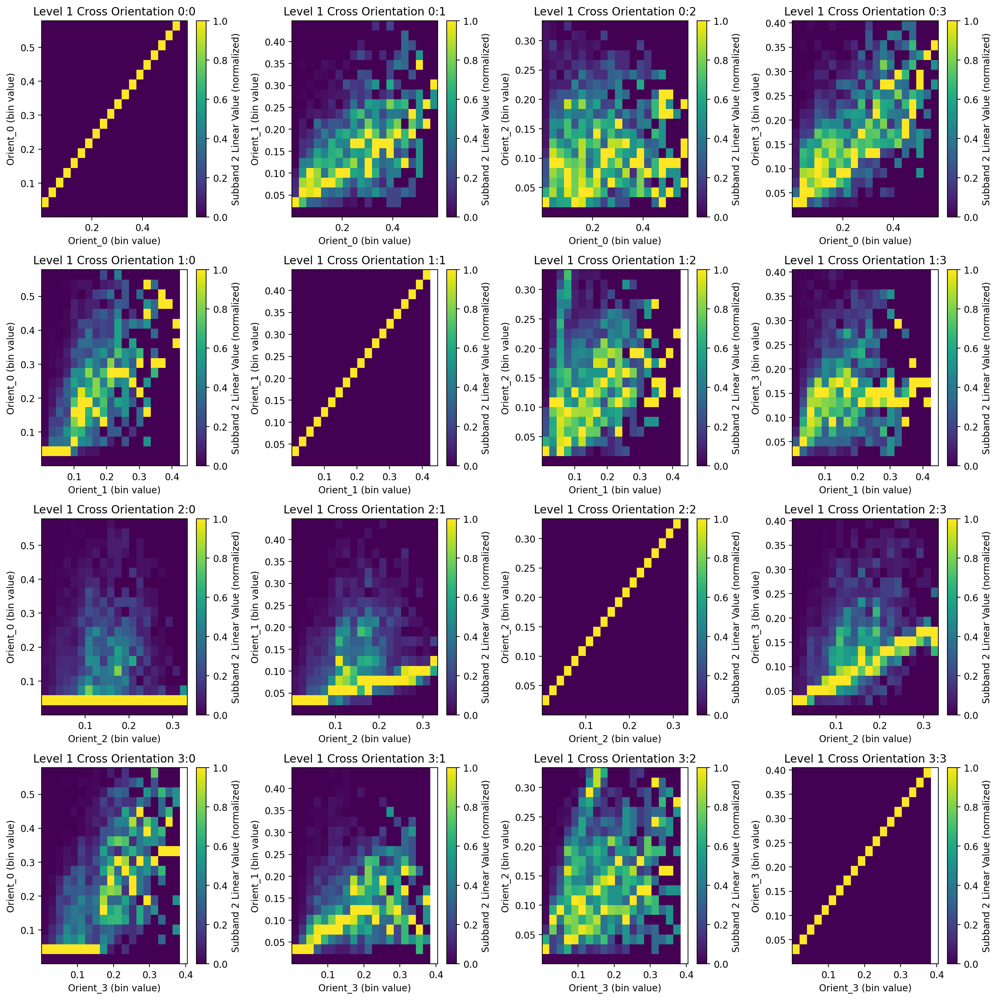

Level 2 Magnitude
****************

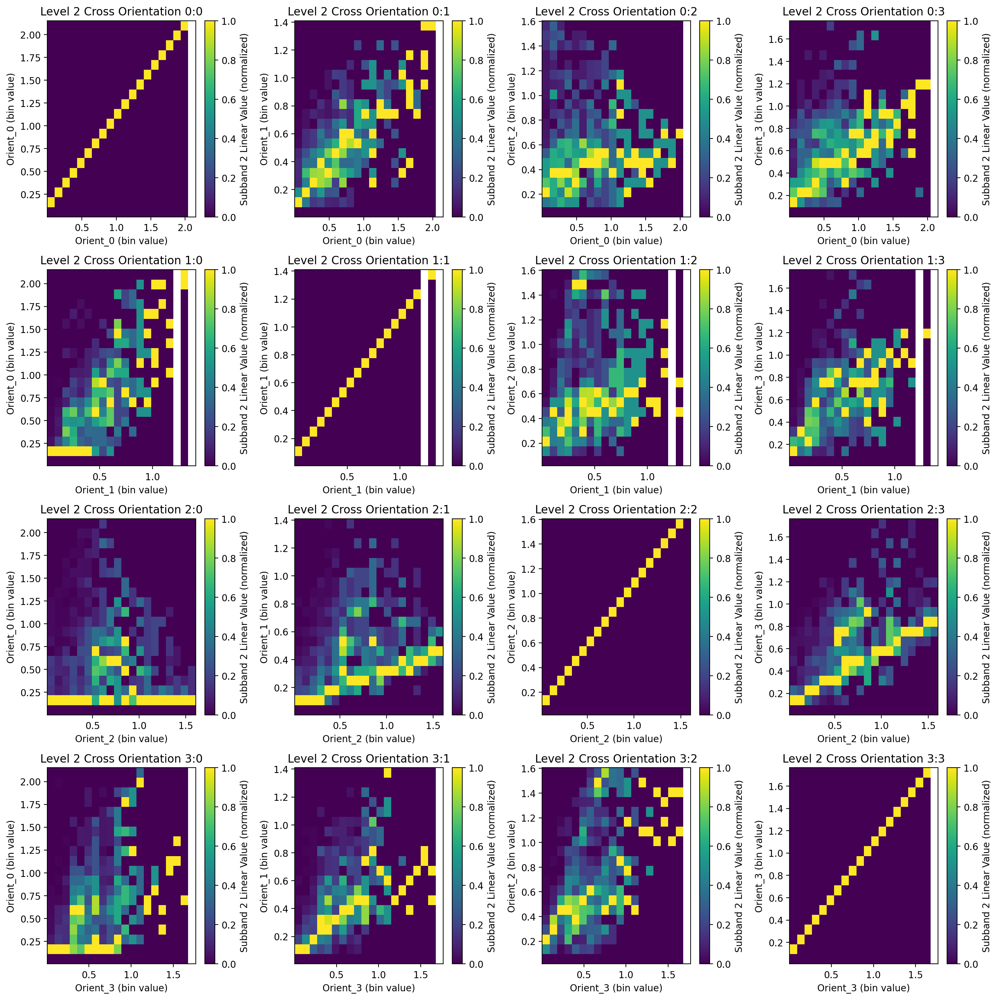

Level 3 Magnitude
****************

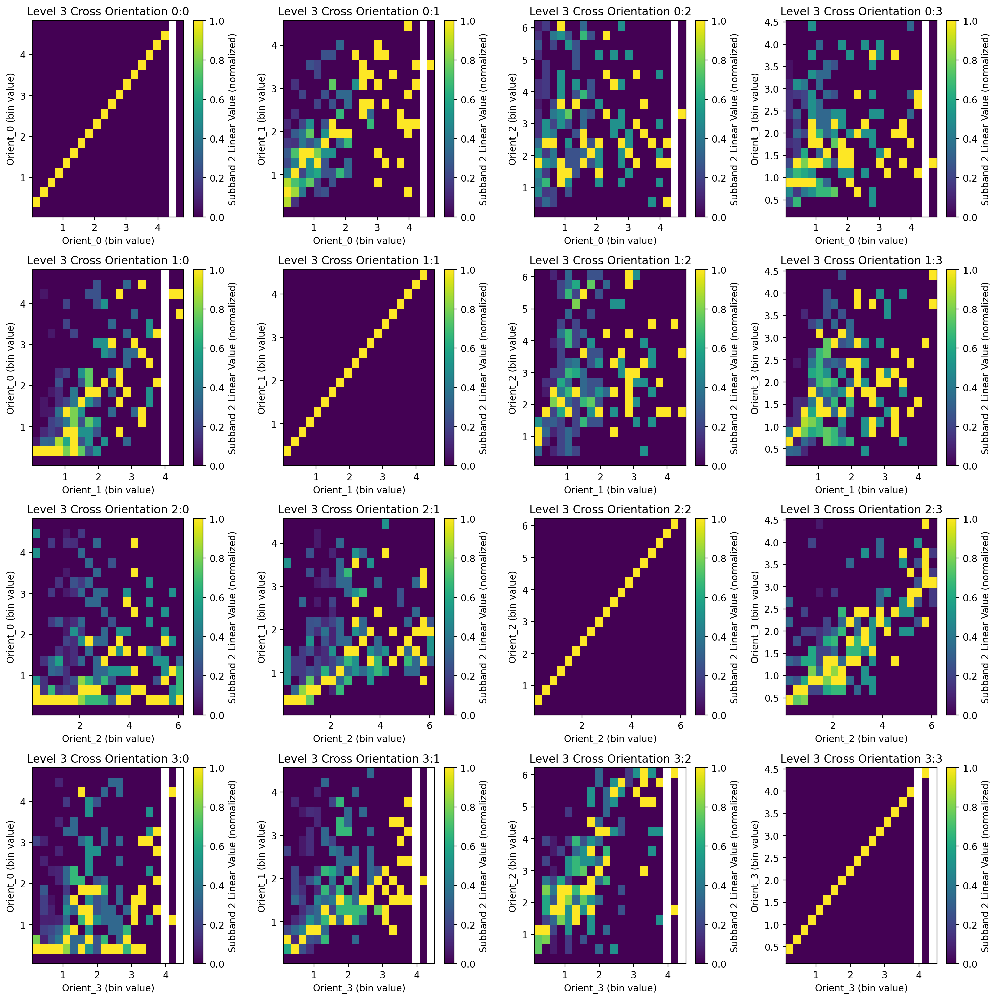

In [5]:
# #Real
# for level in range(pyr_height):
#     print(f'Level {level} Real')
#     plt.figure(figsize=(15,15))
#     fignum=1
#     for orient1 in range(num_orientations):
#         for orient2 in range(num_orientations):
#             band1_label=f'Orient_{orient1}'
#             band2_label=f'Orient_{orient2}'
#             #real
#             subband1 = np.real(img_pyr.pyr_coeffs[(level,orient1)])
#             subband2 = np.real(img_pyr.pyr_coeffs[(level,orient2)])
#             #fname=f'./output/conditional_hists/cross_orient/real/CondHist_Real_Level_{level}_CrossOrient_{band1_label}_cond_{band2_label}.png'
#             print(orient1, orient2)
#             plt.subplot(num_orientations, num_orientations, fignum)
#             butterfly_plot = butterfly_conditional(subband1, subband2, 
#                                                    make_plot=True,
#                                                    showfig=False,
#                                                    band1_label=band1_label,
#                                                    band2_label=band2_label,
#                                                    title_label=f'Level {level} Cross Orientation {orient1}:{orient2}')
#             fignum+=1
#     plt.tight_layout()
#     plt.show()
    
# #Imag
# for level in range(pyr_height):
#     print(f'Level {level} Imaginary')
#     plt.figure(figsize=(15,15))
#     fignum=1
#     for orient1 in range(num_orientations):
#         for orient2 in range(num_orientations):
#             band1_label=f'Orient_{orient1}'
#             band2_label=f'Orient_{orient2}'
#             #real
#             subband1 = np.imag(img_pyr.pyr_coeffs[(level,orient1)])
#             subband2 = np.imag(img_pyr.pyr_coeffs[(level,orient2)])
#             print(orient1, orient2)
#             plt.subplot(num_orientations, num_orientations, fignum)
#             butterfly_plot = butterfly_conditional(subband1, subband2, 
#                                                    make_plot=True,
#                                                    showfig=False,
#                                                    band1_label=band1_label,
#                                                    band2_label=band2_label,
#                                                    title_label=f'Level {level} Cross Orientation {orient1}:{orient2}')
#             fignum+=1
#     plt.tight_layout()
#     plt.show()

imp.reload(ch)

#Magnitude
for level in range(pyr_height):
    print(f'Level {level} Magnitude')
    plt.figure(figsize=(15,15))
    fignum=1
    for orient1 in range(num_orientations):
        for orient2 in range(num_orientations):
            band1_label=f'Orient_{orient1}'
            band2_label=f'Orient_{orient2}'
            #real
            subband1 = np.sqrt(np.real(img_pyr.pyr_coeffs[(level,orient1)])**2 + np.imag(img_pyr.pyr_coeffs[(level,orient1)])**2 )
            subband2 = np.sqrt(np.real(img_pyr.pyr_coeffs[(level,orient2)])**2 + np.imag(img_pyr.pyr_coeffs[(level,orient2)])**2 )
            plt.subplot(num_orientations, num_orientations, fignum)
            butterfly_plot = ch.butterfly_conditional(subband1, subband2, 
                                                   make_plot=True,
                                                   showfig=False,
                                                   band1_label=band1_label,
                                                   band2_label=band2_label,
                                                   title_label=f'Level {level} Cross Orientation {orient1}:{orient2}')
            fignum+=1
    plt.tight_layout()
    plt.show()

### Within Orientation, Cross Level

Orientation 0 Magnitude
****************

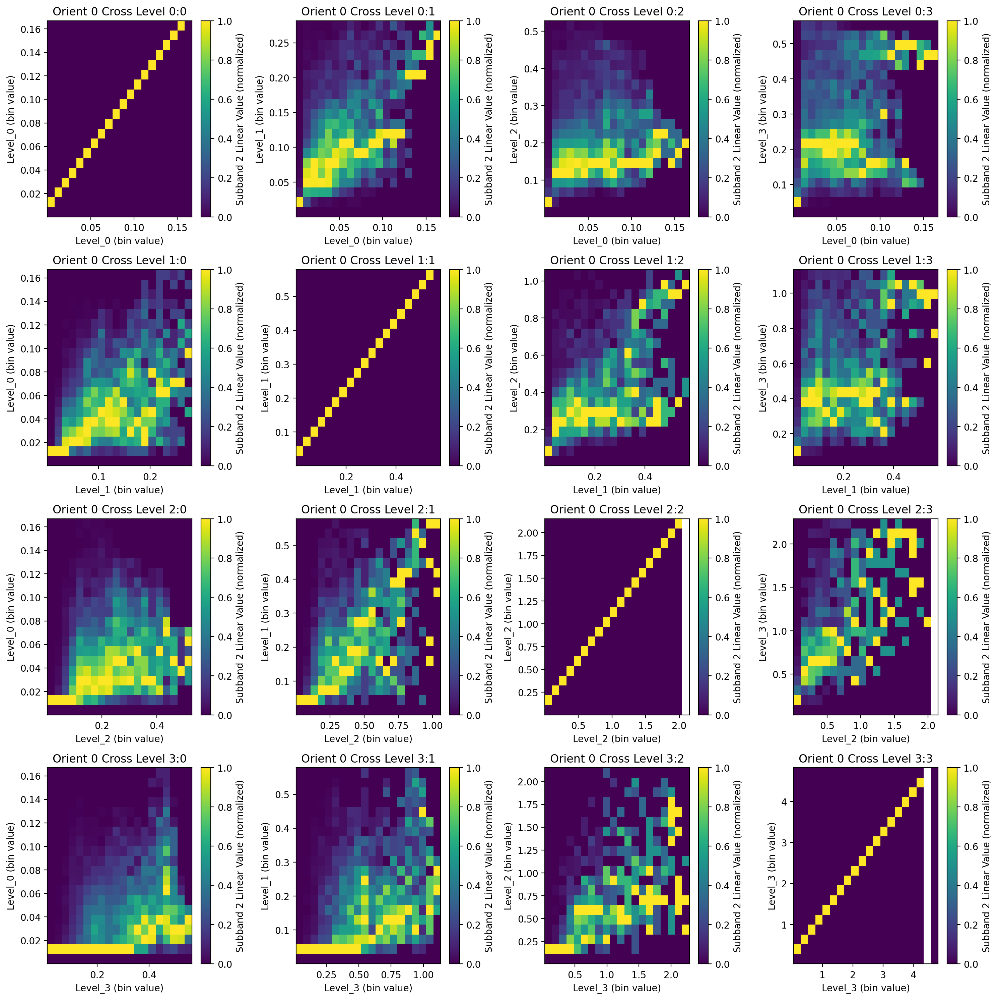

Orientation 1 Magnitude
****************

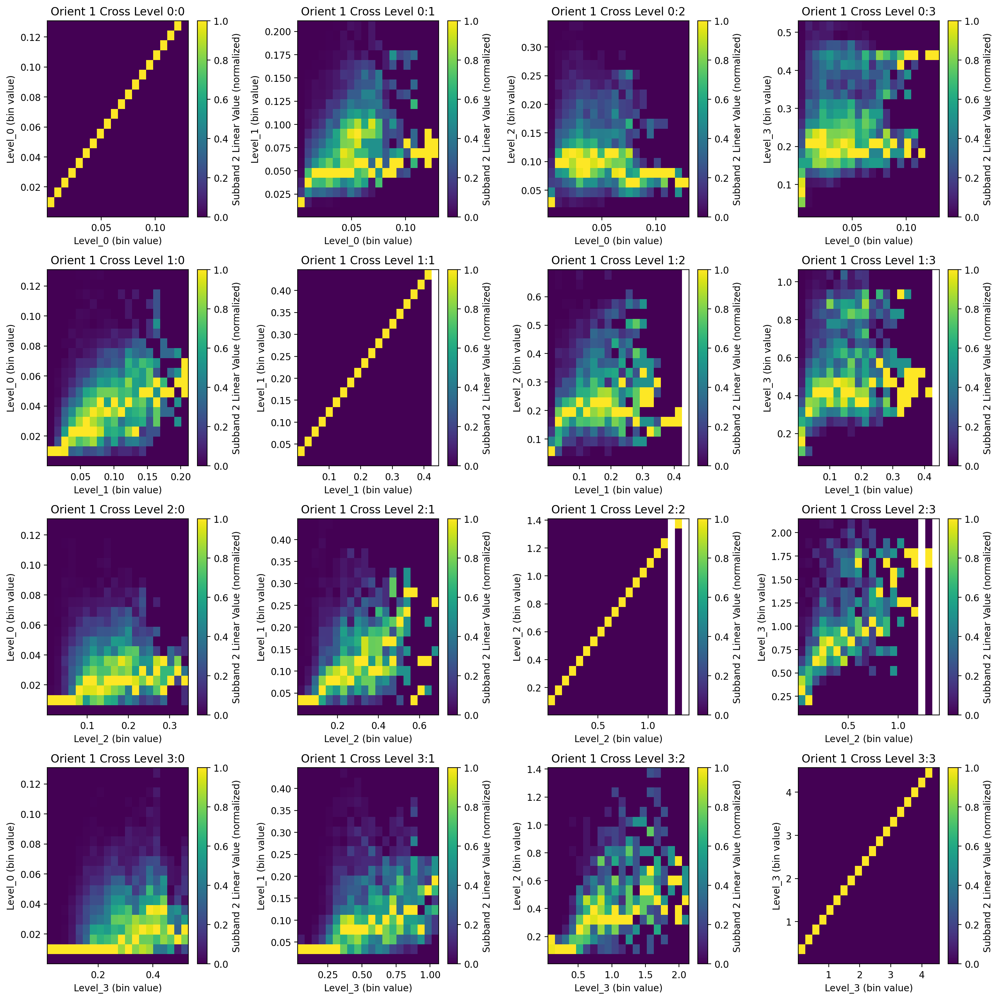

Orientation 2 Magnitude
****************

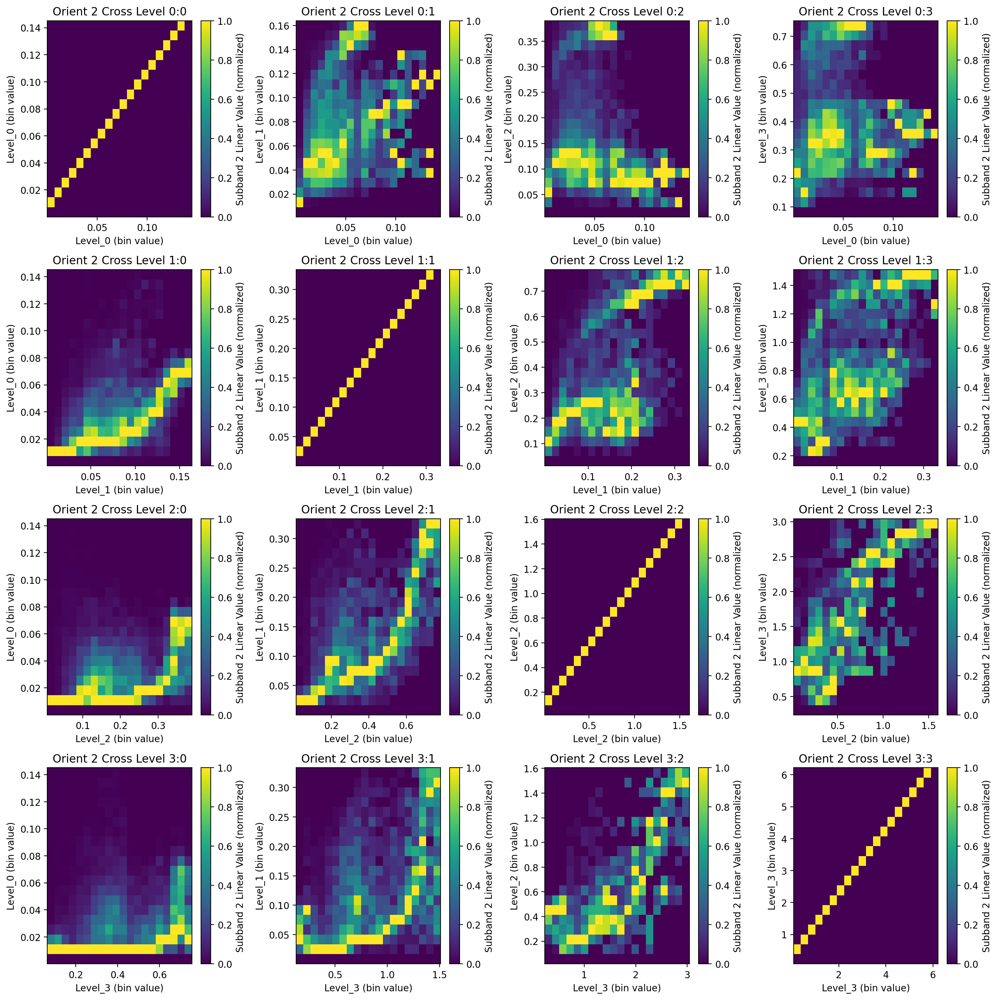

Orientation 3 Magnitude
****************

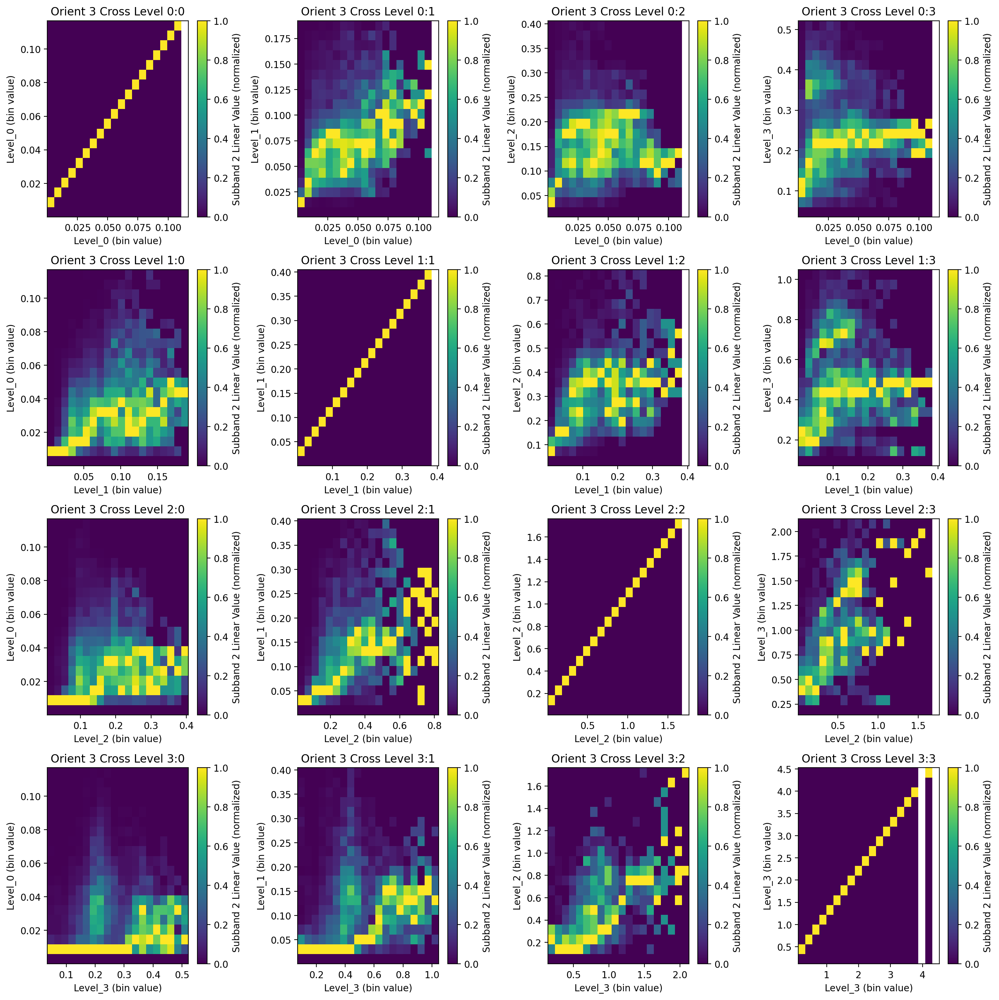

In [6]:
#Real
# for orient in range(num_orientations):
#     print(f'Orientation {orient} Real')
#     plt.figure(figsize=(15,15))
#     fignum=1
#     for level1 in range(pyr_height):
#         for level2 in range(pyr_height):
#             band1_label=f'Level_{level1}'
#             band2_label=f'Level_{level2}'
#             #real
#             subband1 = np.real(img_pyr.pyr_coeffs[(level1,orient)])
#             subband2 = np.real(img_pyr.pyr_coeffs[(level2,orient)])
#             #fname=f'./output/conditional_hists/cross_orient/real/CondHist_Real_Level_{level}_CrossOrient_{band1_label}_cond_{band2_label}.png'
#             print(level1, level2)
#             plt.subplot(pyr_height, pyr_height, fignum)
#             butterfly_plot = butterfly_conditional(subband1, subband2, 
#                                                    make_plot=True,
#                                                    showfig=False,
#                                                    band1_label=band1_label,
#                                                    band2_label=band2_label,
#                                                    title_label=f'Orient {orient} Cross Level {level1}:{level2}')
#             fignum+=1
#     plt.tight_layout()
#     plt.show()


# #Imag
# for orient in range(num_orientations):
#     print(f'Orientation {orient} Imag')
#     plt.figure(figsize=(15,15))
#     fignum=1
#     for level1 in range(pyr_height):
#         for level2 in range(pyr_height):
#             band1_label=f'Level_{level1}'
#             band2_label=f'Level_{level2}'
#             #real
#             subband1 = np.imag(img_pyr.pyr_coeffs[(level1,orient)])
#             subband2 = np.imag(img_pyr.pyr_coeffs[(level2,orient)])
#             #fname=f'./output/conditional_hists/cross_orient/real/CondHist_Real_Level_{level}_CrossOrient_{band1_label}_cond_{band2_label}.png'
#             print(level1, level2)
#             plt.subplot(pyr_height, pyr_height, fignum)
#             butterfly_plot = butterfly_conditional(subband1, subband2, 
#                                                    make_plot=True,
#                                                    showfig=False,
#                                                    band1_label=band1_label,
#                                                    band2_label=band2_label,
#                                                    title_label=f'Orient {orient} Cross Level {level1}:{level2}')
#             fignum+=1
#     plt.tight_layout()
#     plt.show()


#MAGNITUDE
for orient in range(num_orientations):
    print(f'Orientation {orient} Magnitude')
    plt.figure(figsize=(15,15))
    fignum=1
    for level1 in range(pyr_height):
        for level2 in range(pyr_height):
            band1_label=f'Level_{level1}'
            band2_label=f'Level_{level2}'
            subband1 = np.sqrt(np.real(img_pyr.pyr_coeffs[(level1,orient)])**2 + np.imag(img_pyr.pyr_coeffs[(level1,orient)])**2 )
            subband2 = np.sqrt(np.real(img_pyr.pyr_coeffs[(level2,orient)])**2 + np.imag(img_pyr.pyr_coeffs[(level2,orient)])**2 )
            plt.subplot(pyr_height, pyr_height, fignum)
            butterfly_plot = ch.butterfly_conditional(subband1, subband2, 
                                                   make_plot=True,
                                                   showfig=False,
                                                   band1_label=band1_label,
                                                   band2_label=band2_label,
                                                   title_label=f'Orient {orient} Cross Level {level1}:{level2}')
            fignum+=1
    plt.tight_layout()
    plt.show()


### Autocorrelation 7x7 sample

Level 0 Orientation 0 Magnitutde
*************************************************

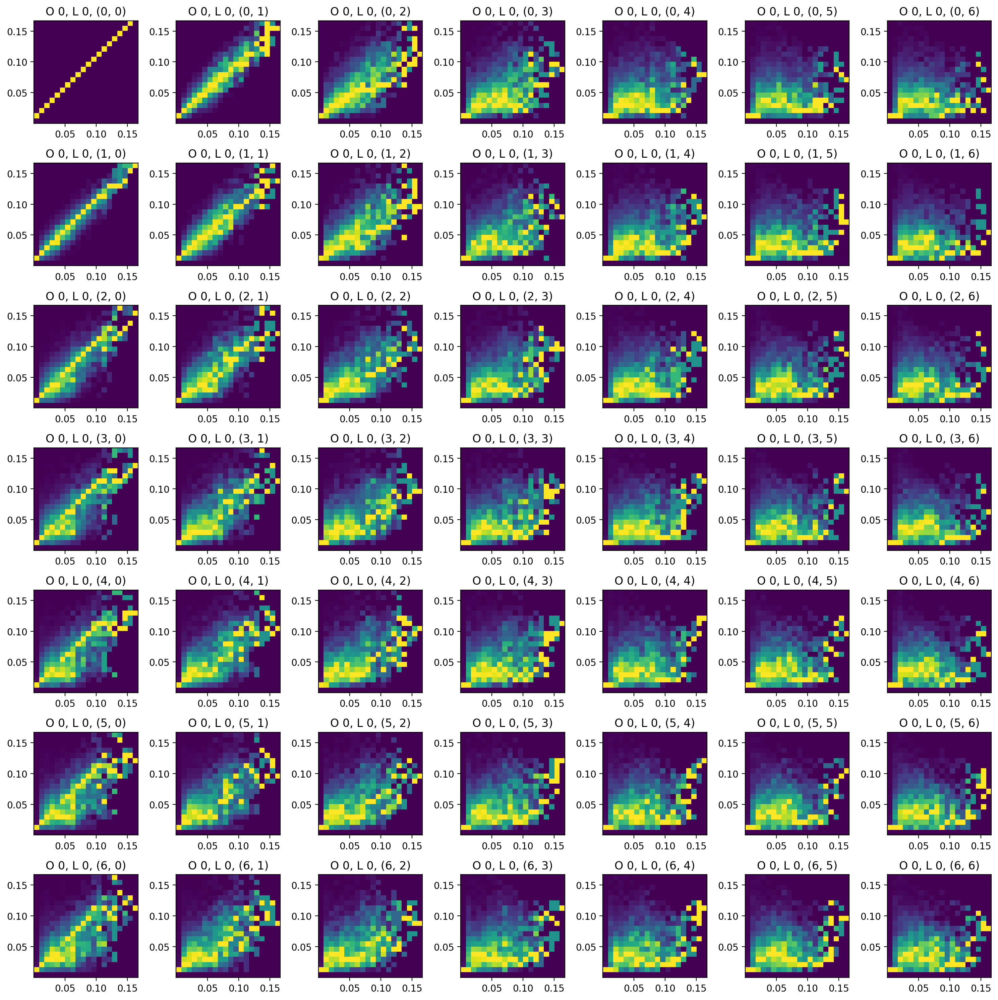

Level 1 Orientation 0 Magnitutde
*************************************************

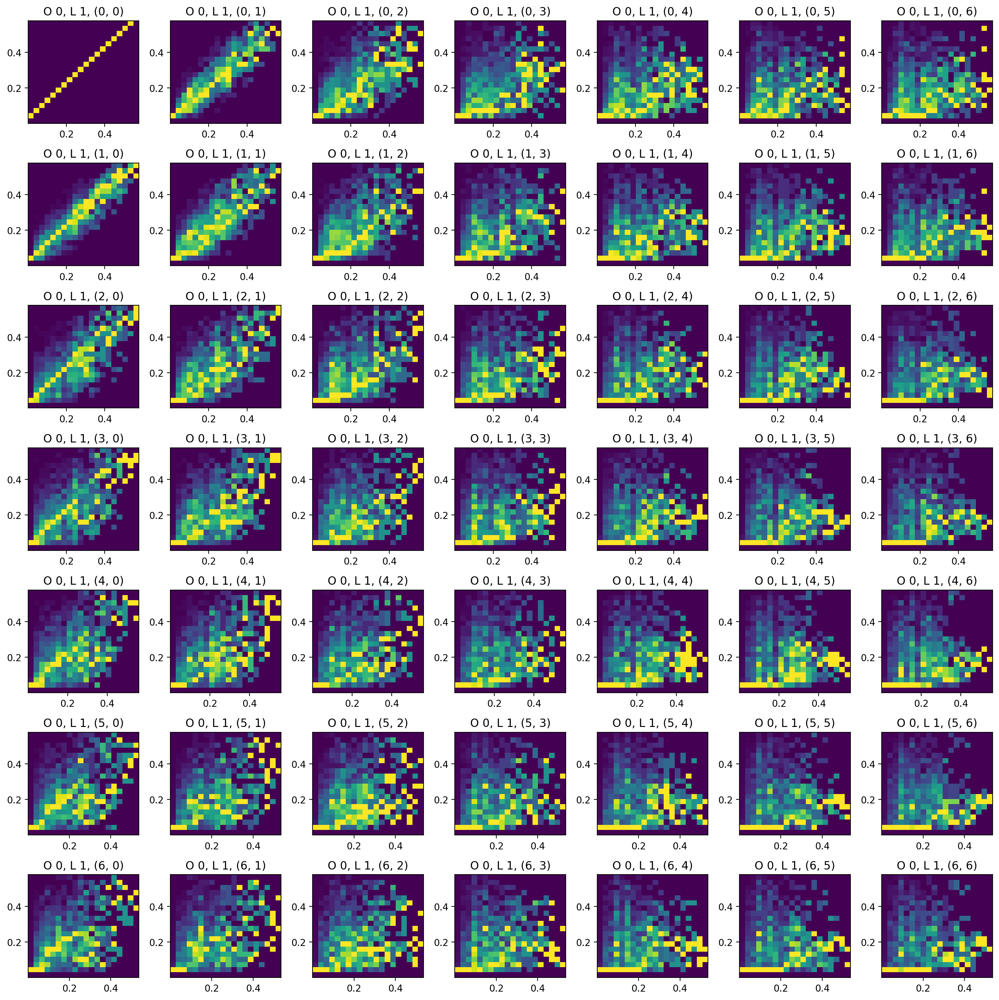

Level 2 Orientation 0 Magnitutde
*************************************************

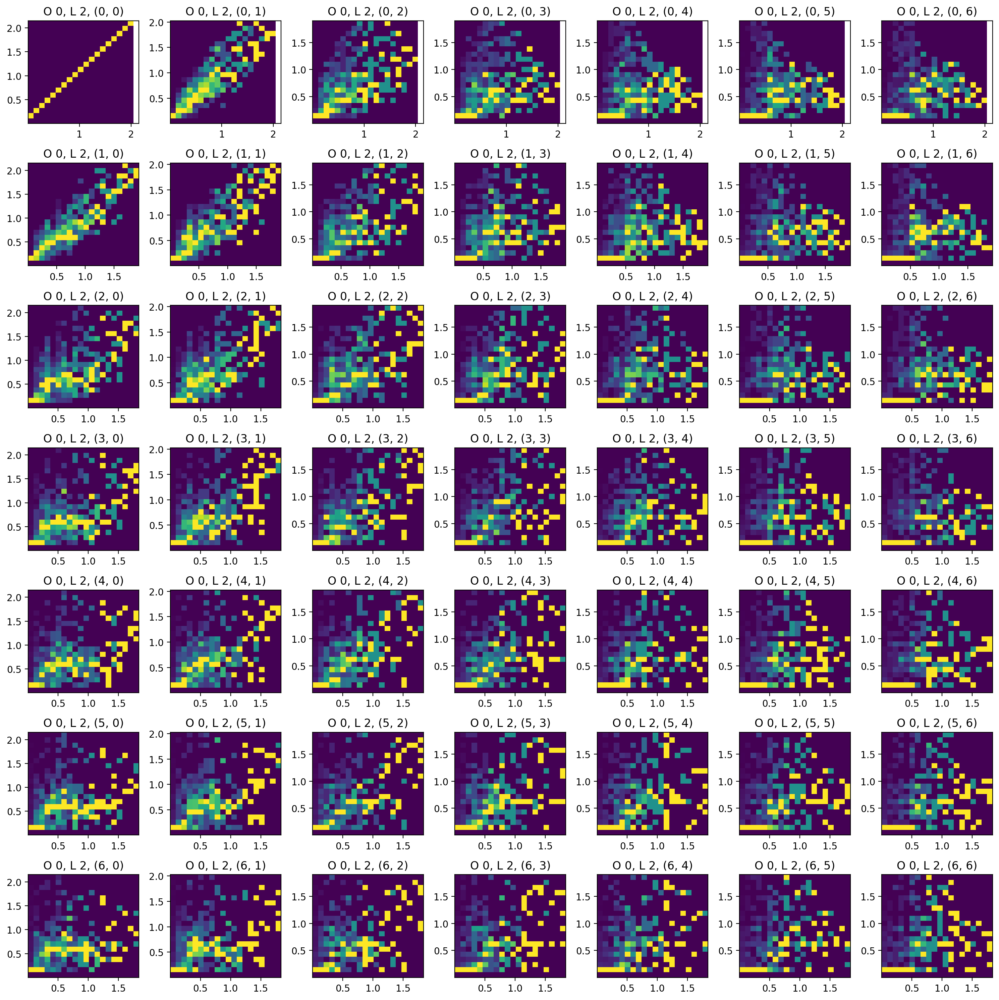

Level 3 Orientation 0 Magnitutde
*************************************************

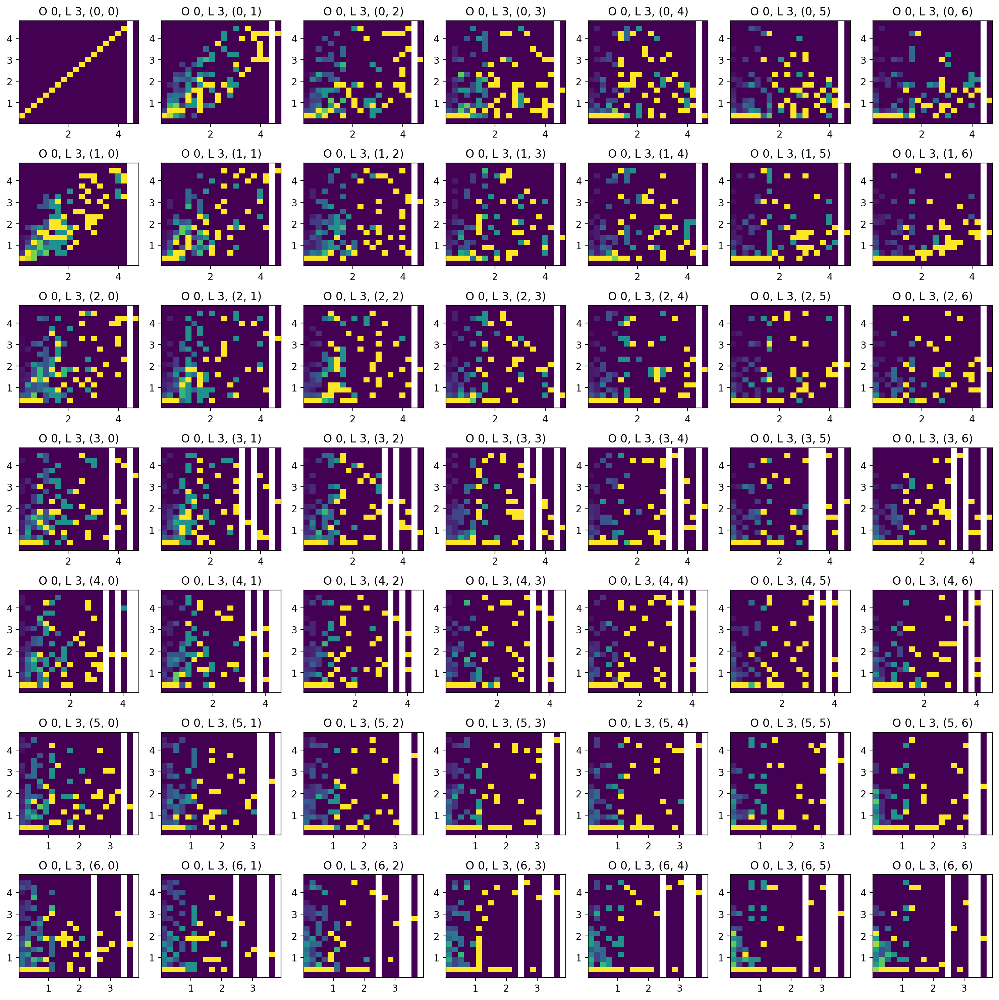

Level 0 Orientation 1 Magnitutde
*************************************************

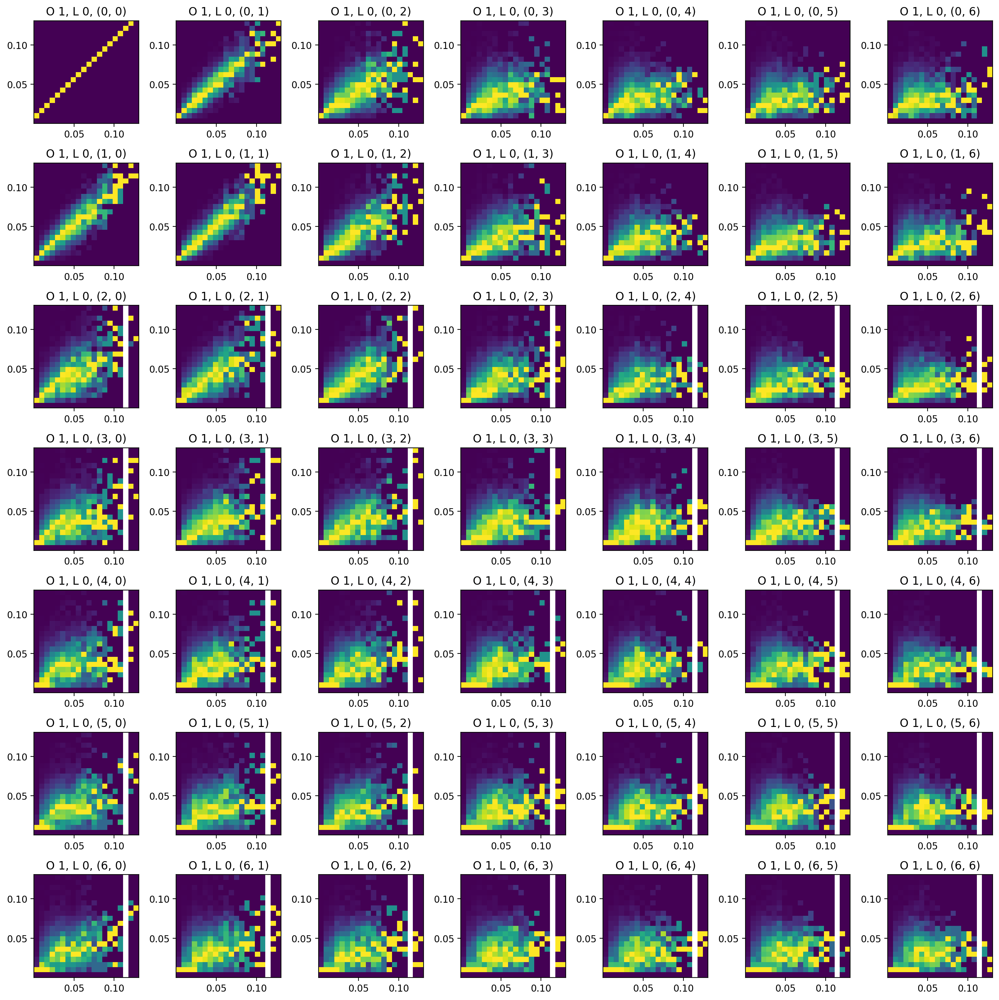

Level 1 Orientation 1 Magnitutde
*************************************************

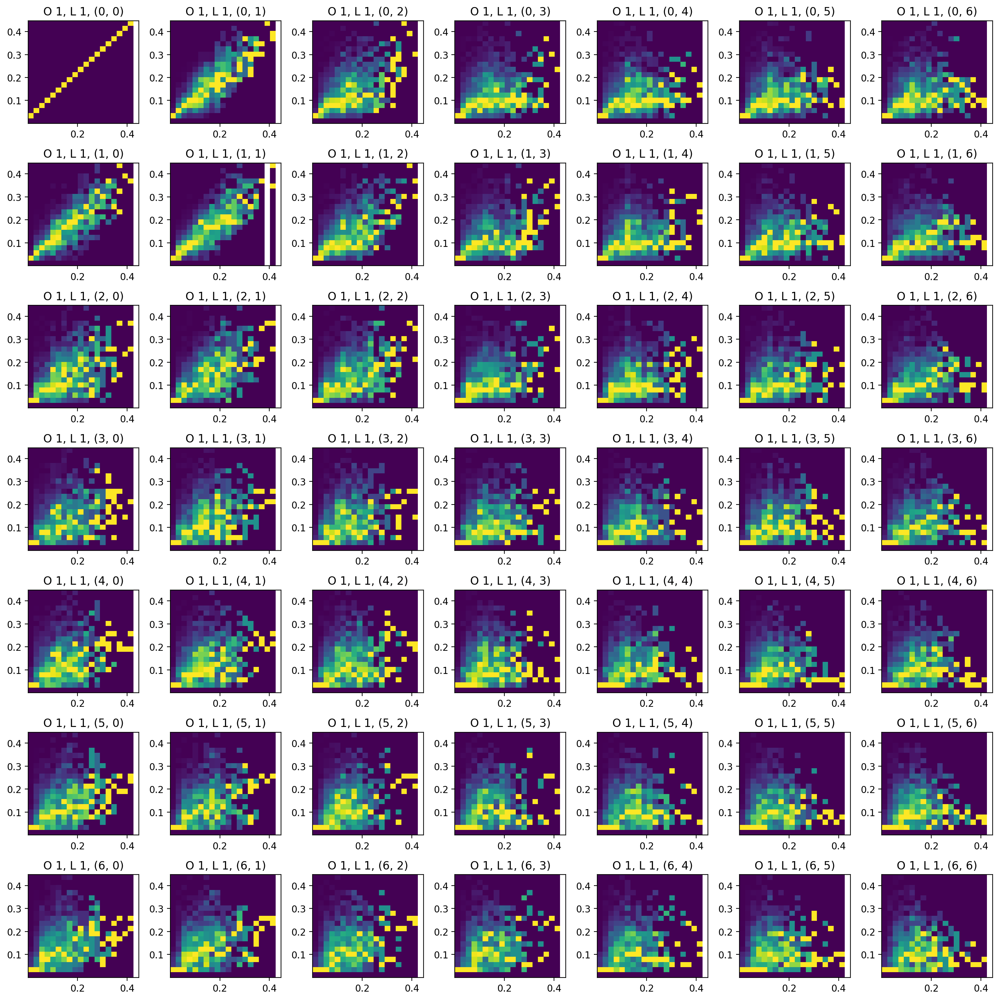

Level 2 Orientation 1 Magnitutde
*************************************************

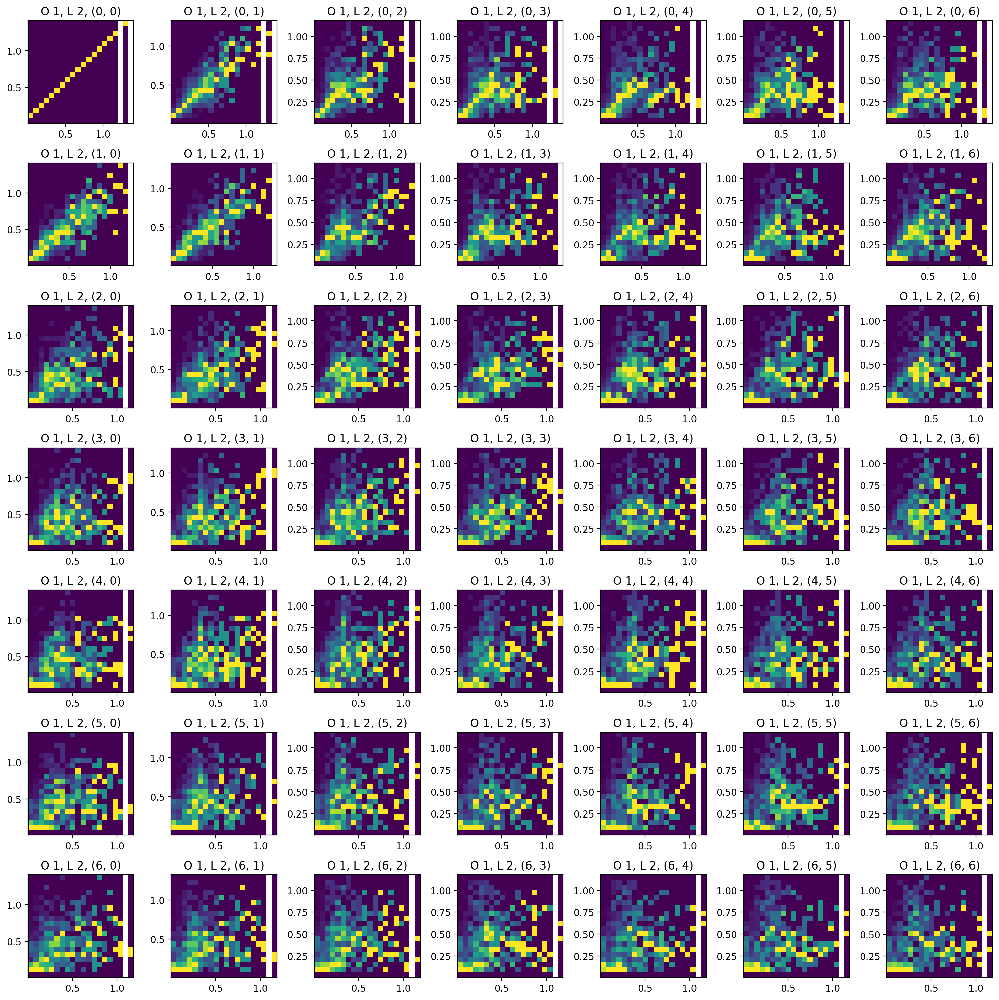

Level 3 Orientation 1 Magnitutde
*************************************************

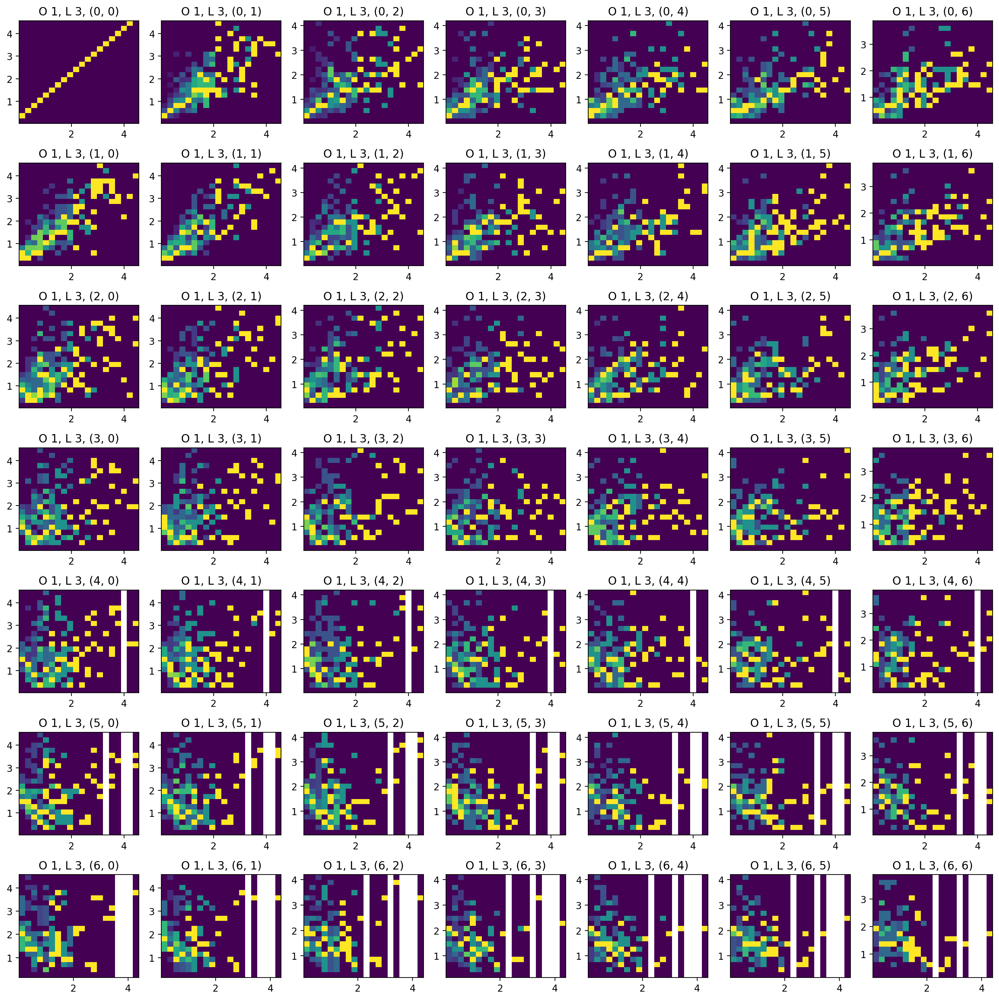

Level 0 Orientation 2 Magnitutde
*************************************************

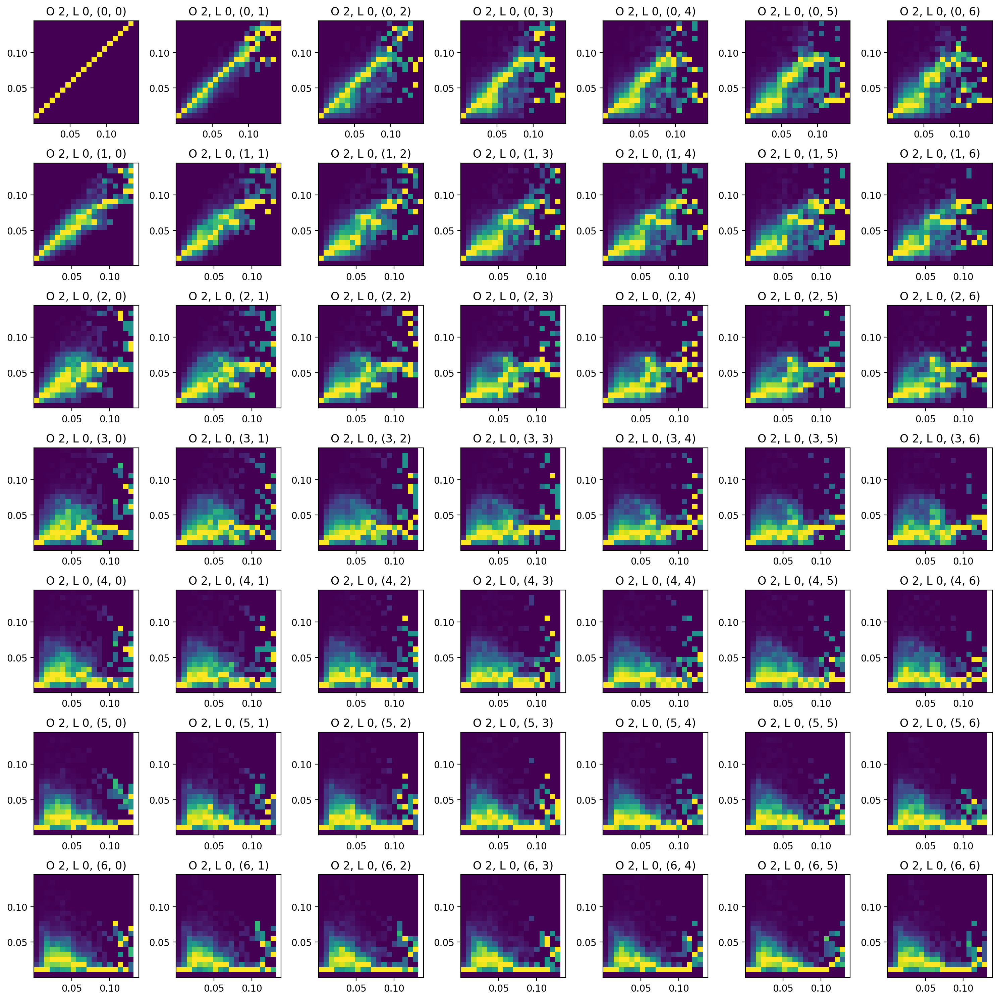

Level 1 Orientation 2 Magnitutde
*************************************************

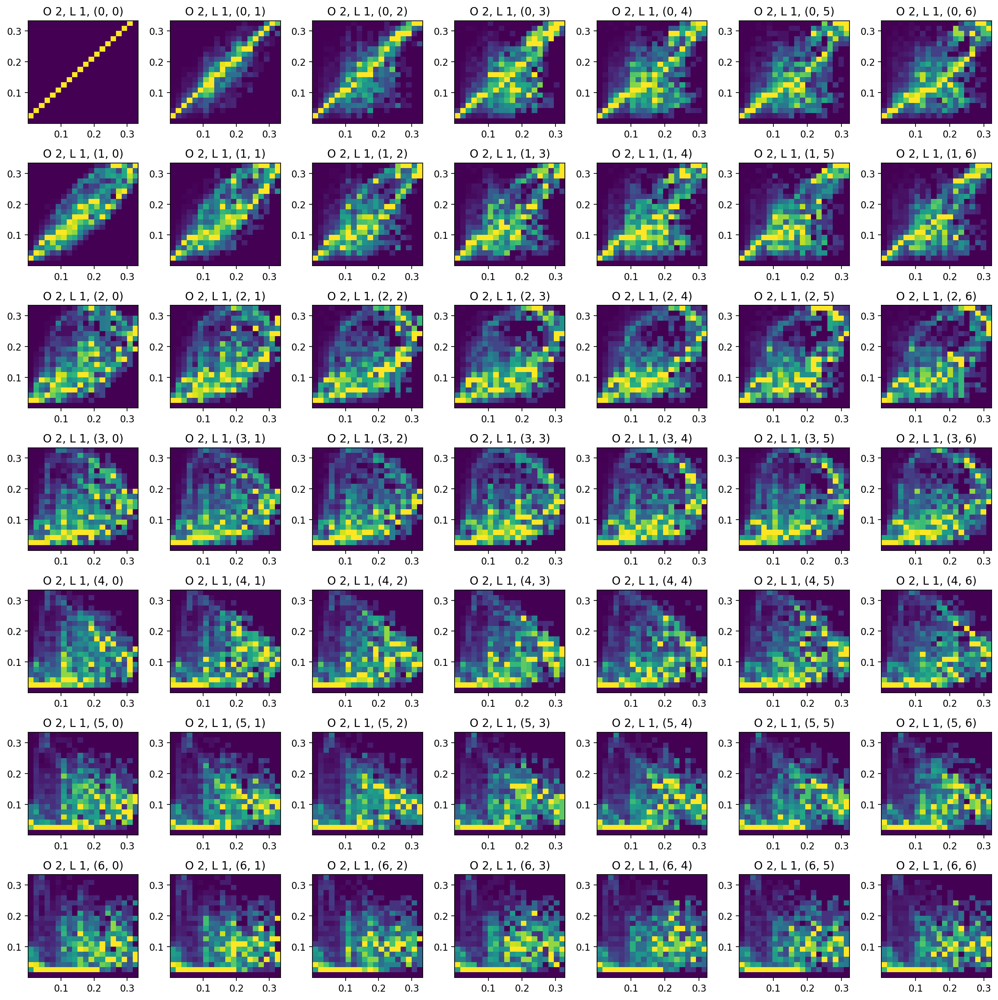

Level 2 Orientation 2 Magnitutde
*************************************************

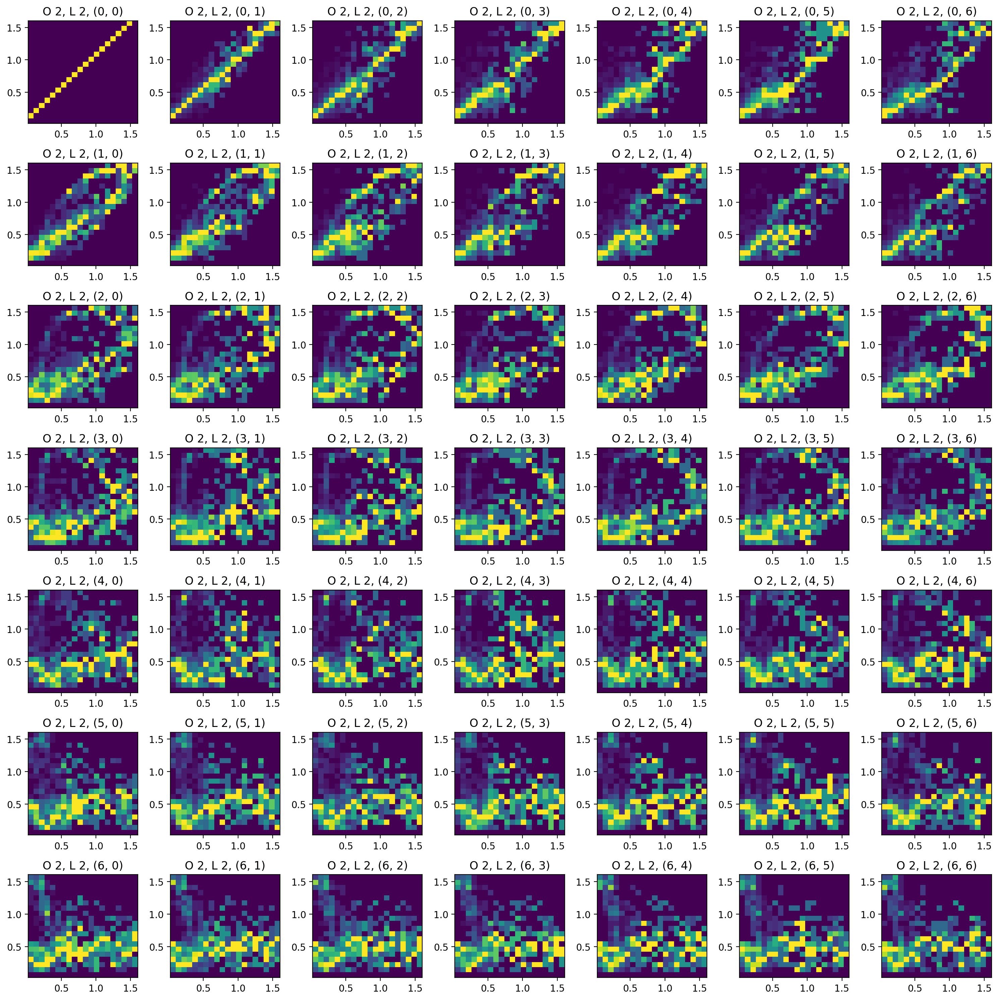

Level 3 Orientation 2 Magnitutde
*************************************************

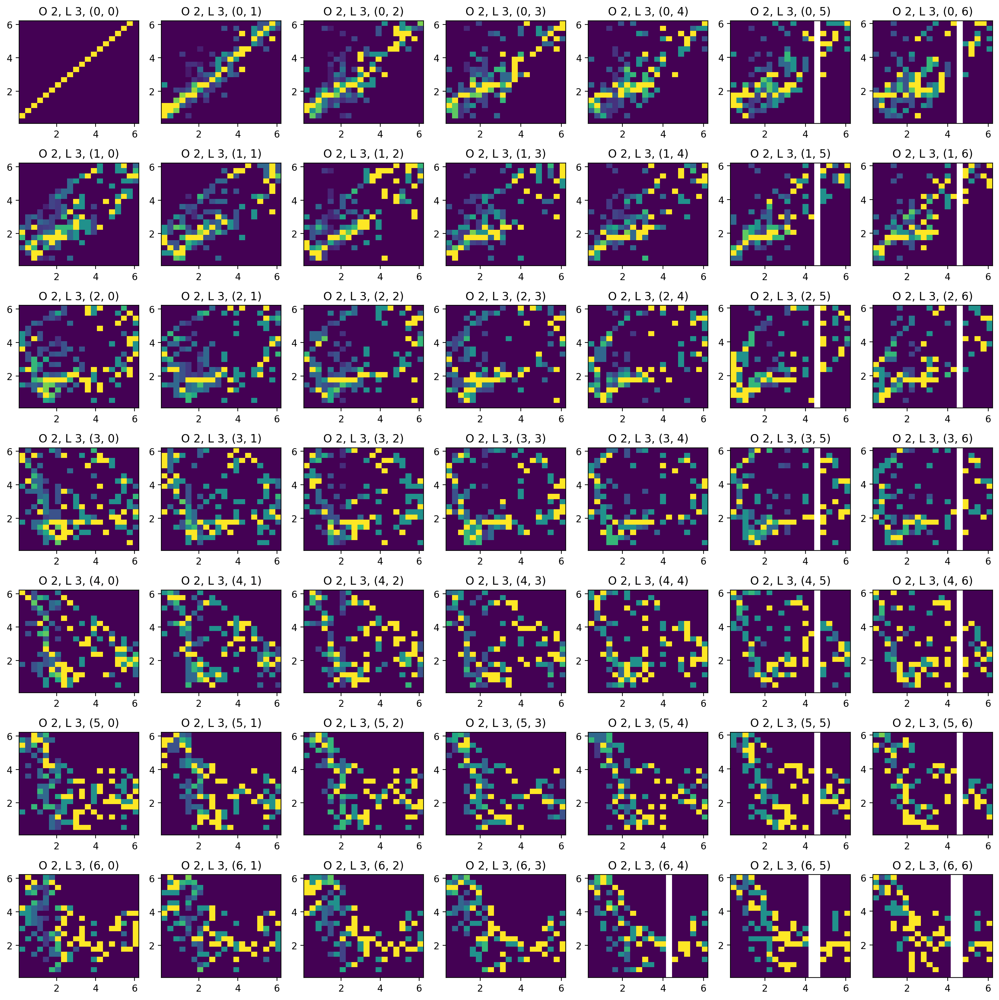

Level 0 Orientation 3 Magnitutde
*************************************************

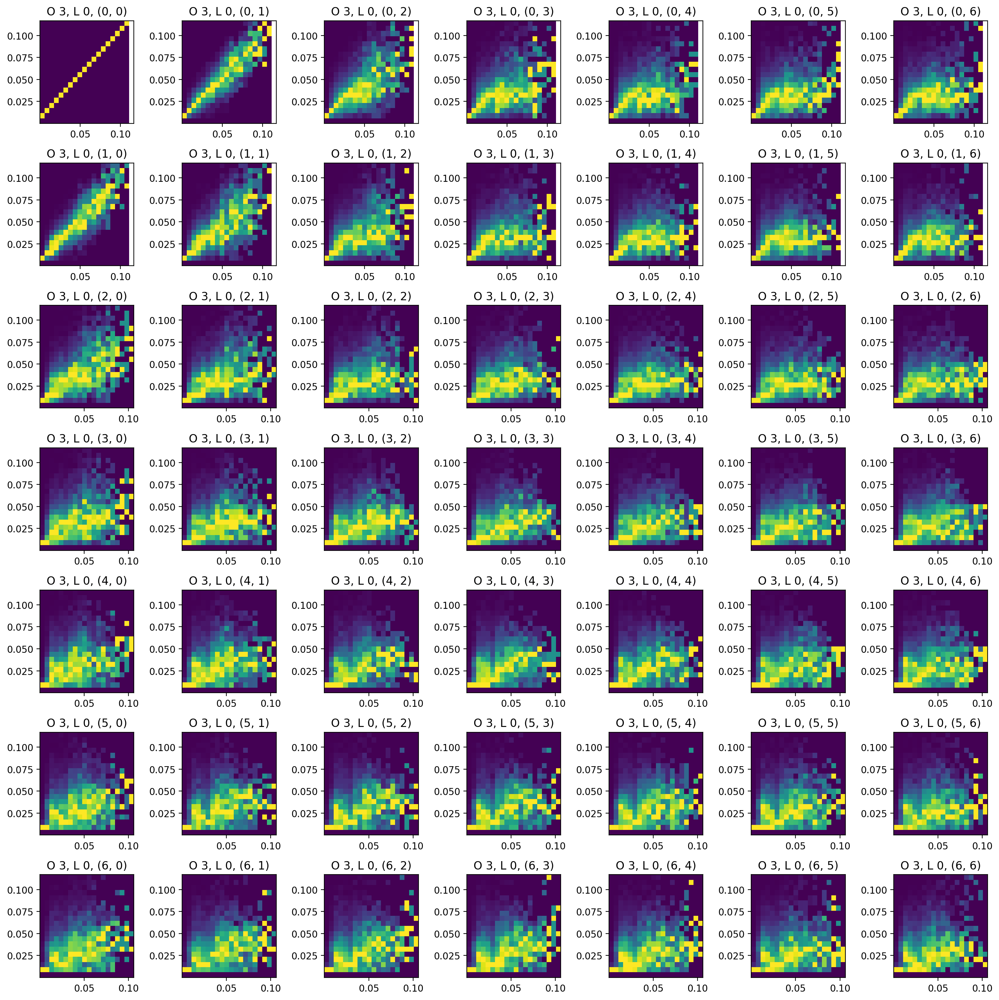

Level 1 Orientation 3 Magnitutde
*************************************************

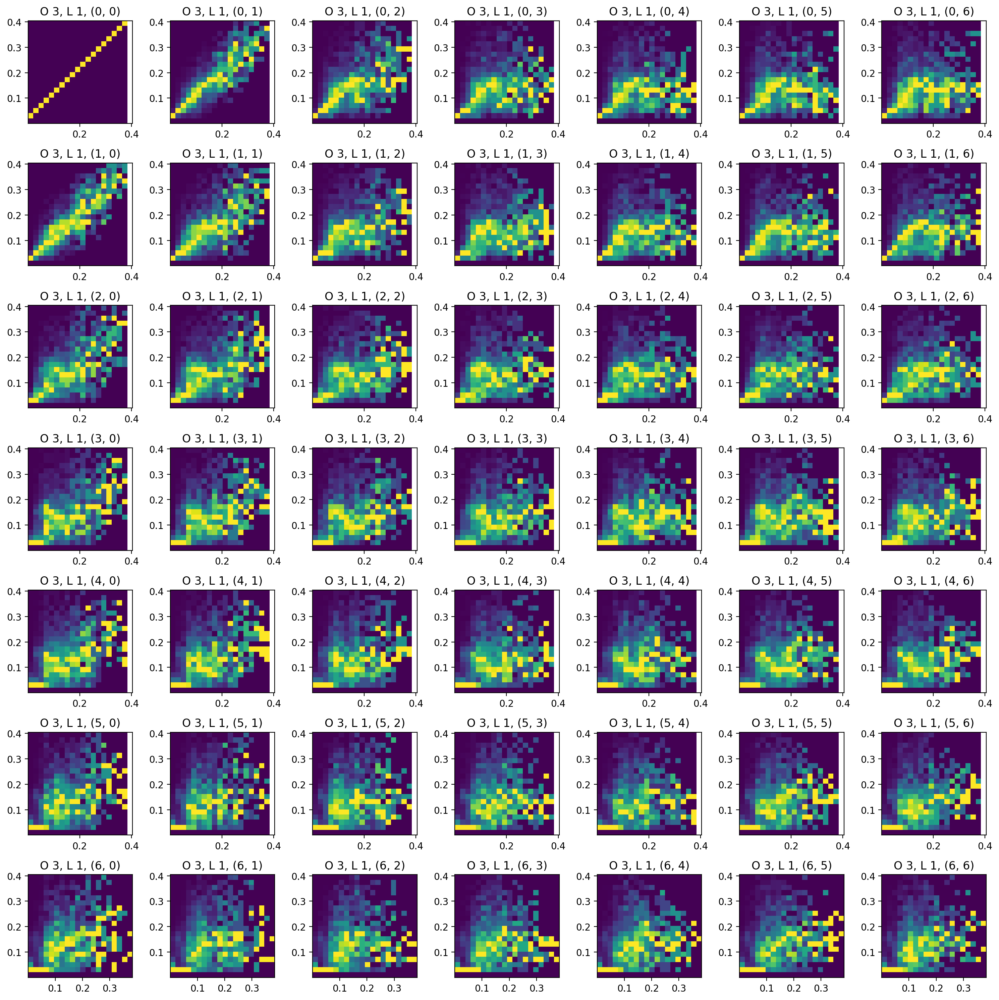

Level 2 Orientation 3 Magnitutde
*************************************************

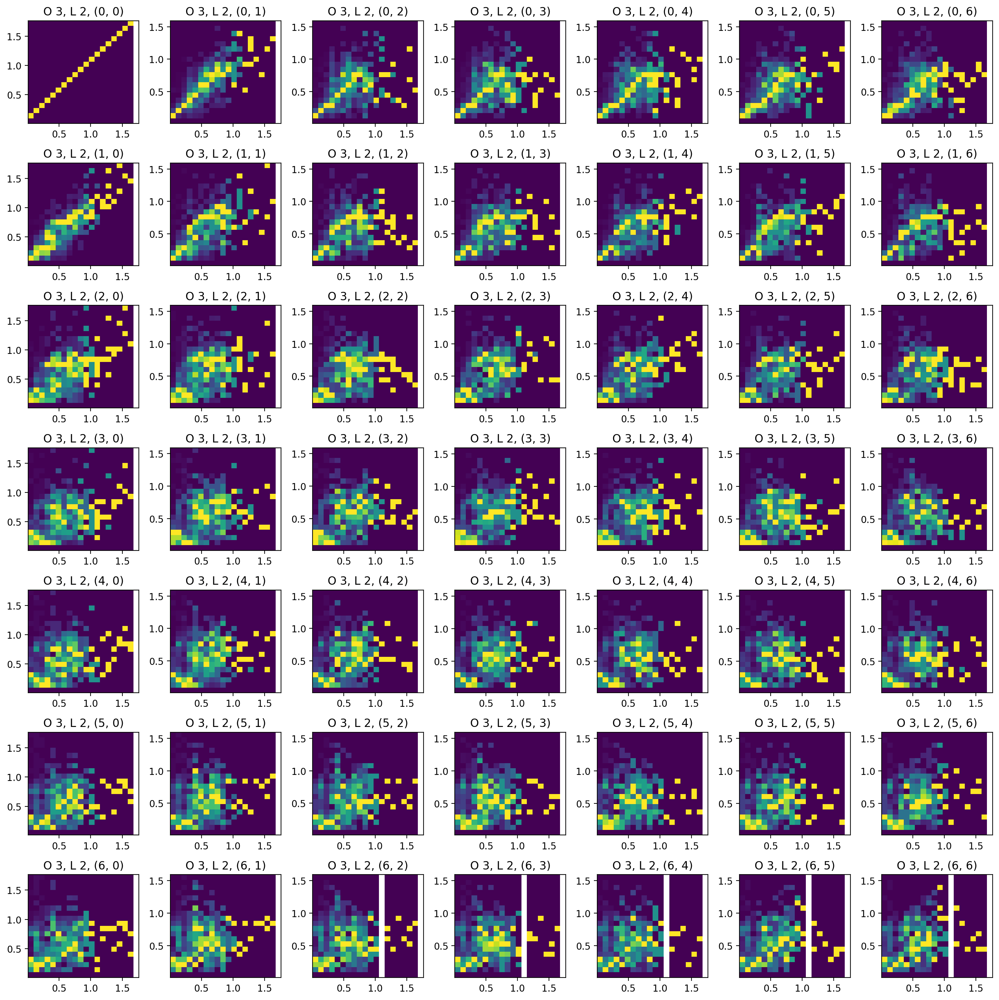

Level 3 Orientation 3 Magnitutde
*************************************************

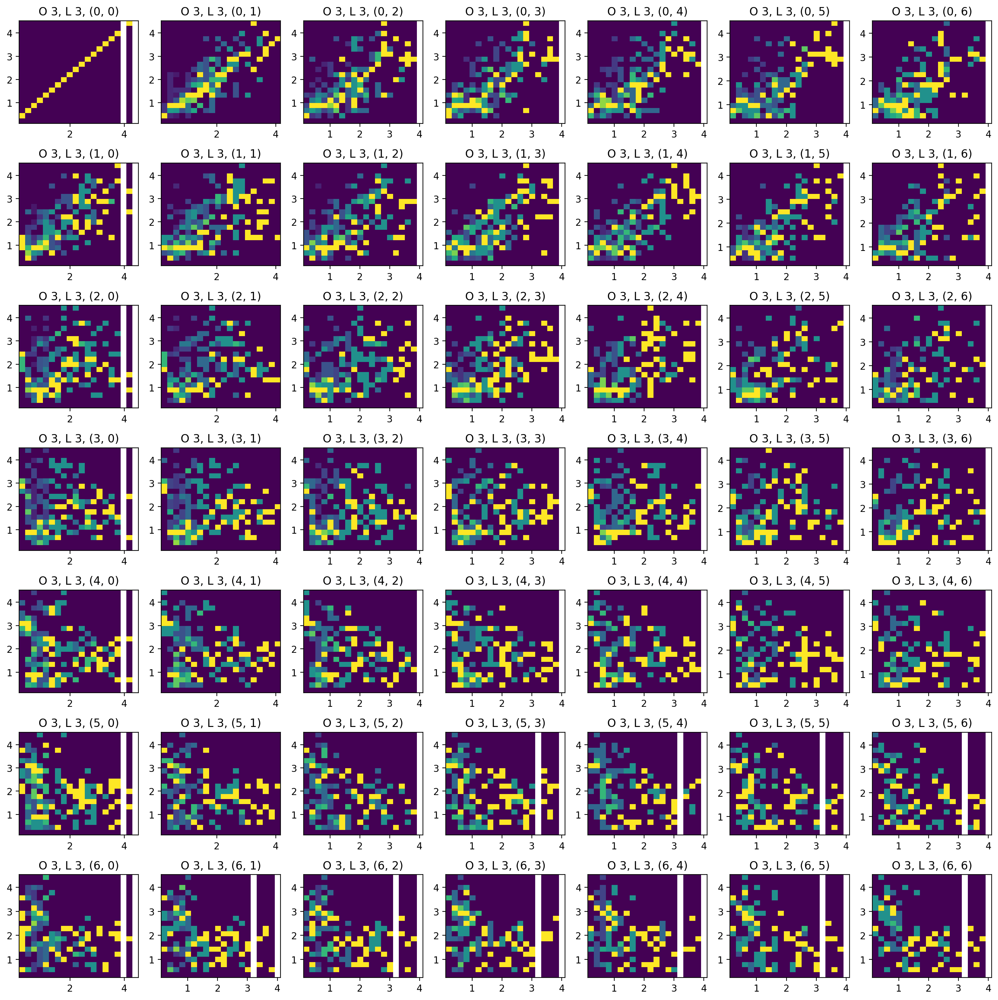

In [7]:
pixel_neighborhood = 7

# # #Real
# for orient in range(num_orientations):
#     for level in range(pyr_height):
#         print(f'Level {level} Orientation {orient} Real')
#         plt.figure(figsize=(15,15))
#         fignum=1
#         for pixel_offset_x in range(pixel_neighborhood):
#             for pixel_offset_y in range(pixel_neighborhood):
#                 subband = np.real(img_pyr.pyr_coeffs[(level,orient)])
#                 #crop based on offset
#                 subband1 = subband[:subband.shape[0]-pixel_offset_x,:subband.shape[1]-pixel_offset_y]
#                 subband2 = subband[pixel_offset_x:,pixel_offset_y:]
#                 plt.subplot(pixel_neighborhood, pixel_neighborhood, fignum)
#                 butterfly_plot = butterfly_conditional(subband1, subband2, make_plot=True, showfig=False,
#                                                    show_labels=False,
#                                                    title_label=f'O {orient}, L {level}, {(pixel_offset_x,pixel_offset_y)}',
#                                                     show_cbar=False)
#                 fignum+=1
#         plt.tight_layout()
#         plt.show()



# # #Imag
# for orient in range(num_orientations):
#     for level in range(pyr_height):
#         print(f'Level {level} Orientation {orient} Imag')
#         plt.figure(figsize=(15,15))
#         fignum=1
#         for pixel_offset_x in range(pixel_neighborhood):
#             for pixel_offset_y in range(pixel_neighborhood):
#                 subband = np.imag(img_pyr.pyr_coeffs[(level,orient)])
#                 #crop based on offset
#                 subband1 = subband[:subband.shape[0]-pixel_offset_x,:subband.shape[1]-pixel_offset_y]
#                 subband2 = subband[pixel_offset_x:,pixel_offset_y:]
#                 plt.subplot(pixel_neighborhood, pixel_neighborhood, fignum)
#                 butterfly_plot = butterfly_conditional(subband1, subband2, make_plot=True, showfig=False,
#                                                    show_labels=False,
#                                                    title_label=f'O {orient}, L {level}, {(pixel_offset_x,pixel_offset_y)}',
#                                                     show_cbar=False)
#                 fignum+=1
#         plt.tight_layout()
#         plt.show()

        
        
# #Imag
for orient in range(num_orientations):
    for level in range(pyr_height):
        print(f'Level {level} Orientation {orient} Magnitutde')
        plt.figure(figsize=(15,15))
        fignum=1
        for pixel_offset_x in range(pixel_neighborhood):
            for pixel_offset_y in range(pixel_neighborhood):
                subband = np.sqrt(np.real(img_pyr.pyr_coeffs[(level,orient)])**2 + np.imag(img_pyr.pyr_coeffs[(level,orient)])**2 )
                #crop based on offset
                subband1 = subband[:subband.shape[0]-pixel_offset_x,:subband.shape[1]-pixel_offset_y]
                subband2 = subband[pixel_offset_x:,pixel_offset_y:]
                plt.subplot(pixel_neighborhood, pixel_neighborhood, fignum)
                butterfly_plot = ch.butterfly_conditional(subband1, subband2, make_plot=True, showfig=False,
                                                   show_labels=False,
                                                   title_label=f'O {orient}, L {level}, {(pixel_offset_x,pixel_offset_y)}',
                                                    show_cbar=False)
                fignum+=1
        plt.tight_layout()
        plt.show()
        
    
# #Imag
# for level in range(pyr_height):
#     print(f'Level {level} Imaginary')
#     plt.figure(figsize=(15,15))
#     fignum=1
#     for orient1 in range(num_orientations):
#         for orient2 in range(num_orientations):
#             band1_label=f'Orient_{orient1}'
#             band2_label=f'Orient_{orient2}'
#             #real
#             subband1 = np.imag(img_pyr.pyr_coeffs[(level,orient1)])
#             subband2 = np.imag(img_pyr.pyr_coeffs[(level,orient2)])
#             print(orient1, orient2)
#             plt.subplot(num_orientations, num_orientations, fignum)
#             butterfly_plot = butterfly_conditional(subband1, subband2, 
#                                                    make_plot=True,
#                                                    showfig=False,
#                                                    band1_label=band1_label,
#                                                    band2_label=band2_label,
#                                                    title_label=f'Level {level} Cross Orientation {orient1}:{orient2}')
#             fignum+=1
#     plt.tight_layout()
#     plt.show()


# #Magnitude
# for level in range(pyr_height):
#     print(f'Level {level} Magnitude')
#     plt.figure(figsize=(15,15))
#     fignum=1
#     for orient1 in range(num_orientations):
#         for orient2 in range(num_orientations):
#             band1_label=f'Orient_{orient1}'
#             band2_label=f'Orient_{orient2}'
#             #real
#             subband1 = np.sqrt(np.real(img_pyr.pyr_coeffs[(level,orient1)])**2 + np.imag(img_pyr.pyr_coeffs[(level,orient1)])**2 )
#             subband2 = np.sqrt(np.real(img_pyr.pyr_coeffs[(level,orient2)])**2 + np.imag(img_pyr.pyr_coeffs[(level,orient2)])**2 )
#             print(orient1, orient2)
#             plt.subplot(num_orientations, num_orientations, fignum)
#             butterfly_plot = butterfly_conditional(subband1, subband2, 
#                                                    make_plot=True,
#                                                    showfig=False,
#                                                    band1_label=band1_label,
#                                                    band2_label=band2_label,
#                                                    title_label=f'Level {level} Cross Orientation {orient1}:{orient2}')
#             fignum+=1
#     plt.tight_layout()
#     plt.show()